# Session 2 : Free energies from pre-trained machine learning potentials

## Importing Required Libraries for Molecular Simulation

This cell imports all the necessary Python packages and modules used throughout the notebook for molecular modeling and simulation.

### Core Libraries

- **NumPy (`numpy`)**  
  Provides support for numerical operations, arrays, and mathematical functions.

- **OpenFF Toolkit (`openff.toolkit`)**  
  Used to define and manipulate molecular structures in a standardized way.

### OpenMM Components

- **`openmm.app`**  
  Contains high-level tools for setting up molecular simulations:
  - `ForceField`: Defines the force field parameters.
  - `Modeller`: Used to build and modify molecular systems (e.g., adding solvent).
  - `Simulation`: Main class to run molecular dynamics simulations.
  - `NoCutoff`: Specifies nonbonded interaction settings.

- **`openmm` and `openmm.unit`**  
  Provide the core simulation engine and unit handling system for physical quantities (e.g., temperature, time).

### Force Field Generators

- **GAFF Template Generator (`openmmforcefields.generators`)**  
  Allows automatic parameterization of small molecules using the General Amber Force Field (GAFF).

### Integrators

Integrators define how the equations of motion are solved:

- `VerletIntegrator`: Basic integrator for deterministic simulations.
- `LangevinMiddleIntegrator`: Adds temperature control via stochastic dynamics.

### Reporting and Output

- **`StateDataReporter`**  
  Outputs simulation data such as energy, temperature, and progress during the run.

### Units

Specific physical units are imported for clarity and consistency:
- `kelvin` (temperature)
- `picosecond`, `femtosecond` (time)

### Miscellaneous

- **`sys`**  
  Provides access to system-specific parameters and functions (e.g., command-line arguments).

---

These imports collectively set up the environment required to build, parameterize, and run molecular dynamics simulations using OpenMM and related tools.

In [3]:
import numpy as np
from openff.toolkit import Molecule
from openmm.app import ForceField, Modeller, Simulation, NoCutoff
from openmmforcefields.generators import GAFFTemplateGenerator
from openmm import unit, openmm
from openmm import VerletIntegrator
import sys
from openmm import LangevinMiddleIntegrator
from openmm.app import Simulation, StateDataReporter
from openmm.unit import kelvin, picosecond, femtosecond

### Building and Preparing a Molecular System
This cell constructs a molecular system starting from a SMILES string, generates 3D coordinates, and prepares it for simulation using a force field.
- **`Create a molecule from SMILES`**
The molecule is defined using the SMILES string "C=CC=O", which encodes its chemical structure in a compact text format.
- **`Generate 3D conformers`**
Since SMILES only contains 2D connectivity information, a 3D conformer (geometry) is generated. Here, only one conformer is created for the molecule.
- **`Set up GAFF parameterization`**
The General Amber Force Field (GAFF 2.1) is applied to assign parameters such as bond lengths, angles, and charges appropriate for small organic molecules.
- **`Initialize and register the force field`**
A ForceField object is created, and the GAFF template generator is registered so that the molecule receives proper parameters automatically.
- **`Convert to OpenMM topology and positions`**
The molecule is transformed into an OpenMM topology, which describes atoms and bonds, and its 3D atomic positions are extracted.
- **`Create a modeller object`**
The Modeller combines the topology and positions into a single object. This object can be modified later to add solvent, ions, or other modifications before running a simulation.

In [4]:
mol = Molecule.from_smiles("C=CC=O")
mol.generate_conformers(n_conformers=1)
gaff = GAFFTemplateGenerator(molecules=mol, forcefield="gaff-2.1")
ff = ForceField()
ff.registerTemplateGenerator(gaff.generator)
topology = mol.to_topology().to_openmm()
positions = mol.conformers[0].to_openmm()
modeller = Modeller(topology, positions)

## 1. Build the Molecular System

The force field defined earlier is applied to the molecular topology to create an OpenMM `System`. This system contains all atoms, bonds, and nonbonded interactions required for the simulation. 

- **Nonbonded Method:** `NoCutoff` is used, meaning nonbonded interactions (like van der Waals and electrostatics) are calculated without applying a distance cutoff.

---

## 2. Define a Restraint Potential

A custom torsional potential is created using `CustomTorsionForce`. This allows a specific torsion (dihedral) angle in the molecule to be restrained with a harmonic potential:

- **Potential form:** \( V(\theta) = k \cdot (\theta - \theta_0)^2 \)  
- **Parameters:**  
  - `theta0`: the target torsion angle  
  - `k`: the force constant, defining the strength of the restraint  

This force can be applied to any torsion by specifying the atoms that form it.

---

## 3. Choose Torsion and Apply Parameters

- **TORSION:** The four atoms defining the dihedral angle `(0, 1, 2, 3)`.  
- **Target Angle (`theta0`):** `-π` radians.  
- **Force Constant (`k`):** 100 kJ/mol·rad².  

The torsion and its parameters are added to the custom force, and the force is then added to the system. This constrains the chosen torsion to remain near the target angle during the simulation.

In [5]:
#1. Build molecular system
system = ff.createSystem(modeller.topology, nonbondedMethod=NoCutoff)

#2. Define restrain potential
restr = openmm.CustomTorsionForce("k*(theta-theta0)^2")
restr.addPerTorsionParameter("theta0")
restr.addPerTorsionParameter("k")

#3. Choose torsion and parameters
TORSION = (0,1,2,3)
theta0 = -np.pi * unit.radian
k = 75.0 * unit.kilojoule_per_mole/unit.radian**2
restr.addTorsion(*TORSION, [theta0, 0])
system.addForce(restr)


5

## 4. Minimize the System with GAFF and Restraints

This cell performs energy minimization on the molecular system using the GAFF force field and the torsion restraint defined earlier.

### Step-by-Step Explanation

1. **Set up the Integrator**  
   A `VerletIntegrator` is initialized with a time step of 1 femtosecond. The integrator is responsible for propagating the system in time, but here it is primarily used to allow the minimization algorithm to operate.

2. **Create the Simulation Object**  
   The `Simulation` class combines the topology, system, and integrator. It represents the complete molecular dynamics environment where energy minimization and later simulations can be performed.

3. **Set Atomic Positions**  
   The previously generated 3D positions are loaded into the simulation context. This ensures that minimization starts from the correct geometry.

4. **Energy Minimization**  
   The `minimizeEnergy` function relaxes the system to a local energy minimum while respecting the torsional restraint. A tolerance of 0.001 (kJ/mol) is used to determine convergence.

5. **Extract Atomic Numbers**  
   After minimization, the list of atomic numbers is retrieved from the topology. This provides a simple representation of the elements present in the system, which can be useful for analysis or later parametrization.

## 4. Minimize the System with GAFF and Restraints

In this step, the molecular system is energy-minimized while considering the GAFF force field and the torsion restraint defined earlier.

- **Set up the Integrator:**  
  A `VerletIntegrator` with a time step of 1 femtosecond is created. The integrator is used here to perform energy minimization.

- **Create the Simulation:**  
  A `Simulation` object is initialized with the system’s topology, the system itself, and the integrator. This object manages the molecular dynamics environment.

- **Set Atomic Positions:**  
  The 3D coordinates from the molecule’s conformer are loaded into the simulation context, ensuring minimization starts from the correct geometry.

- **Energy Minimization:**  
  The `minimizeEnergy` function relaxes the system to a local energy minimum while keeping the torsion restraint in effect. A convergence tolerance of 0.001 kJ/mol is used.

- **Retrieve Atomic Numbers:**  
  After minimization, the atomic numbers of all atoms in the topology are extracted. This provides a simple reference for the types of elements present in the molecule.

In [6]:
#4. Minimize the system with GAFF + restrain
integrator = VerletIntegrator(1.0 * unit.femtoseconds)
sim = Simulation(modeller.topology, system, integrator)
sim.context.setPositions(positions)
sim.minimizeEnergy(tolerance=0.001)

state = sim.context.getState(getPositions=True)
pos = state.getPositions()

sim.context.setPositions(pos)

# Get the list of atomic numbers
atomic_numbers = [atom.element.atomic_number for atom in modeller.topology.atoms()]

## Basic principle of the ANI-2x neural network potential

**Source**: https://doi.org/10.1039/C6SC05720A

The ANI-2x model belongs to the family of **neural network potentials (NNPs)**, whose goal is to approximate the **quantum mechanical potential energy surface (PES)** of molecules using machine learning.

![alt text](ani.gif "ANI NN potential")


### Key idea

Instead of solving the electronic structure problem explicitly (e.g., DFT), ANI-2x learns a mapping:

$$
\{ \mathbf{R}_i \} \;\longrightarrow\; E_{\text{total}}
$$

from atomic positions to molecular energy, trained on reference quantum chemistry data.

---

### Atomic decomposition

The total energy is written as a **sum of atomic contributions**:

$$
E_{\text{total}} = \sum_i E_i
$$

Each atomic energy $E_i$ depends only on the **local chemical environment** of atom $i$, within a cutoff radius.

This ensures:
- size extensivity
- transferability across molecules

---

## Atomic Environment Vectors (AEVs) in ANI-2x

The central ingredient of ANI-type potentials is the **Atomic Environment Vector (AEV)**, which encodes the local geometry around each atom into a fixed-length, symmetry-invariant descriptor.

For each atom $i$, the AEV is constructed from **radial** and **angular symmetry functions**:

$$
\mathbf{G}_i = \left\{ G_i^{R}, \; G_i^{A} \right\}
$$

---

### Radial symmetry functions (2-body terms)

These describe pairwise distances between atom $i$ and its neighbors $j$:

$$
G_i^{R} = \sum_{j \neq i} e^{-\eta (R_{ij} - R_s)^2} \; f_c(R_{ij})
$$

where:
- $R_{ij}$ is the interatomic distance
- $\eta$, $R_s$ are hyperparameters defining resolution
- $f_c(R)$ is a cutoff function

A standard cutoff function is:

$$
f_c(R) =
\begin{cases}
\frac{1}{2} \left[ \cos\left(\frac{\pi R}{R_c}\right) + 1 \right], & R \le R_c \\
0, & R > R_c
\end{cases}
$$

This ensures smooth decay to zero at the cutoff radius $R_c$.

---

### Angular symmetry functions (3-body terms)

These encode angles formed by atom $i$ and pairs of neighbors $j, k$:

$$
G_i^{A} = 2^{1-\zeta} \sum_{j \neq i} \sum_{k \neq i, j}
(1 + \cos \theta_{ijk})^{\zeta}
\exp\left[-\eta \left( R_{ij}^2 + R_{ik}^2 + R_{jk}^2 \right)\right]
f_c(R_{ij}) f_c(R_{ik}) f_c(R_{jk})
$$

where:
- $\theta_{ijk}$ is the angle centered at atom $i$
- $\zeta$, $\eta$ control angular resolution

---

### Chemical resolution

In ANI, symmetry functions are **partitioned by atomic species**:

- Radial terms are computed separately for each neighbor element type
- Angular terms are computed for each pair of element types $(Z_j, Z_k)$

This yields a descriptor that distinguishes chemical environments (e.g., C–H vs C–O).

---

### Properties of AEVs

The AEV construction guarantees:

- **Translational invariance** (depends only on distances)
- **Rotational invariance** (depends on distances and angles)
- **Permutation invariance** (sums over neighbors)
- **Locality** (cutoff $R_c$)

---

### Role in ANI-2x

The AEV $\mathbf{G}_i$ is the input to an element-specific neural network:

$$
E_i = \mathcal{N}_{Z_i}(\mathbf{G}_i)
$$

and the total energy is:

$$
E_{\text{total}} = \sum_i E_i
$$

---

### Key takeaway

The AEV acts as a **physics-informed feature map** that transforms raw Cartesian coordinates into a structured, symmetry-preserving representation suitable for machine learning of the potential energy surface.

---

### Neural network mapping

Each atom type (H, C, N, O, F, S, Cl in ANI-2x) has its own feedforward neural network:

$$
\text{AEV}_i \;\longrightarrow\; E_i
$$

The networks are trained on large datasets of DFT calculations to reproduce energies with near chemical accuracy.

---

### Locality and efficiency

- Only neighbors within a cutoff contribute → **linear scaling**
- No explicit electrons → much faster than quantum methods
- Retains near-DFT accuracy for organic molecules

ANI-2x extends earlier ANI models by covering a broader chemical space (including F, S, Cl).

---

### Summary

ANI-2x combines:
- **physics-inspired descriptors** (symmetry functions)
- **local energy decomposition**
- **deep neural networks trained on QM data**

to produce a fast, transferable approximation of molecular energies suitable for molecular dynamics and large-scale simulations.

## 5. Define a Neural Network Potential (NNP) with ANI-2x

This cell defines a neural network potential (NNP) using the ANI-2x model implemented in PyTorch and TorchANI. The NNP can predict molecular energies from atomic positions.

### Step-by-Step Explanation

1. **Import Libraries**  
   - `torch` (PyTorch) for tensor computations and neural network operations.  
   - `torchani.models` provides the pre-trained ANI-2x model.  
   - `NNPOps.OptimizedTorchANI` accelerates predictions by optimizing the ANI evaluation.

2. **Define the NNP Class**  
   A custom PyTorch module (`NNP`) is created to wrap the ANI-2x model. This allows easy integration with PyTorch workflows.

3. **Initialization (`__init__`)**  
   - The atomic numbers of the molecule are stored as a tensor and reshaped to have a batch dimension.  
   - An ANI-2x model is created with `periodic_table_index=True` to interpret atomic numbers correctly.  
   - The model is wrapped with `OptimizedTorchANI` to accelerate computations for the specific set of atoms.

4. **Forward Pass (`forward`)**  
   - The input positions are reshaped, converted to float, and scaled from nanometers to angstroms (required by ANI-2x).  
   - The model predicts the energy for the given atomic configuration.  
   - The output energy is converted from Hartree to kJ/mol for compatibility with molecular simulations.

### Outcome

After defining this class, the NNP can be instantiated with a molecule’s atomic numbers and used to compute potential energies from 3D coordinates efficiently.

In [7]:
import torch as pt
from torchani.models import ANI2x
from NNPOps import OptimizedTorchANI

class NNP(pt.nn.Module):

  def __init__(self, atomic_numbers):

    super().__init__()

    # Store the atomic numbers
    self.atomic_numbers = pt.tensor(atomic_numbers).unsqueeze(0)

    # Create an ANI-2x model
    self.model = ANI2x(periodic_table_index=True)

    # Accelerate the model
    self.model = OptimizedTorchANI(self.model, self.atomic_numbers)

  def forward(self, positions):

    # Prepare the positions
    positions = positions.unsqueeze(0).float() * 10 # nm --> Å

    # Run ANI-2x
    result = self.model((self.atomic_numbers, positions))

    # Get the potential energy
    energy = result.energies[0] * 2625.5 # Hartree --> kJ/mol

    return energy

/Users/miquel/miniconda3/envs/wednesday-afternoon/lib/python3.10/site-packages/torchani/aev.py:16: UserWarning: cuaev not installed
  warnings.warn("cuaev not installed")
/Users/miquel/miniconda3/envs/wednesday-afternoon/lib/python3.10/site-packages/torchani/__init__.py:59: UserWarning: Dependency not satisfied, torchani.ase will not be available
  warnings.warn("Dependency not satisfied, torchani.ase will not be available")


## 6. Instantiate the Neural Network Potential and Compute Energy

This cell uses the previously defined NNP class to calculate the potential energy of the minimized molecular structure.

### Step-by-Step Explanation

1. **Create an Instance of the NNP**  
   - The `NNP` class is instantiated with the list of atomic numbers of the molecule.  
   - This initializes the ANI-2x neural network model and prepares it for energy predictions.

2. **Prepare Atomic Positions**  
   - The atomic positions from the `Modeller` object are converted to a PyTorch tensor.  
   - This ensures the positions are in the correct format for the neural network input.

3. **Compute the Potential Energy**  
   - The NNP is called with the positions tensor to predict the potential energy.  
   - The energy is returned in kJ/mol, consistent with the units used in the molecular simulation.

4. **Print the Energy**  
   - The computed energy is converted to a standard Python float and printed.  
   - This gives a quick check of the system’s energy using the neural network potential.

In [8]:
# Create an instance of the model
nnp = NNP(atomic_numbers)

# Comute the potential energy
pos = pt.tensor(modeller.positions.tolist())
energy_1 = float(nnp(pos))
print(energy_1)

/Users/miquel/miniconda3/envs/wednesday-afternoon/lib/python3.10/site-packages/torchani/resources/
-502884.947668967


## 7. Integrate the Neural Network Potential with OpenMM

This cell demonstrates how to use OpenMM-Torch to apply the previously defined neural network potential (NNP) within an OpenMM simulation.

### Step-by-Step Explanation

1. **Save the NNP Model**  
   - The PyTorch NNP is converted to a TorchScript model using `pt.jit.script` and saved to a file (`model.pt`).  
   - TorchScript allows the model to be loaded outside Python for efficient evaluation.

2. **Load the NNP with OpenMM-Torch**  
   - `TorchForce` from `openmmtorch` is used to load the saved model.  
   - `TorchForce` wraps the neural network as an OpenMM force, so it can compute energies and forces during simulations.

3. **Add the Neural Network Force to the System**  
   - The `TorchForce` is added to the OpenMM `System` object alongside any other classical forces (e.g., GAFF, restraints).  
   - This allows the simulation to combine classical force fields and the neural network potential for hybrid molecular dynamics.

In [9]:
from openmmtorch import TorchForce

# Save the NNP to a file and load it with OpenMM-Torch
pt.jit.script(nnp).save('model.pt')
force = TorchForce('model.pt')

# Add the NNP to the system
system.addForce(force)

6

## 8. Set Up Molecular Dynamics Simulation

This cell sets up a full molecular dynamics (MD) simulation using OpenMM with the neural network potential included.

### Step-by-Step Explanation

1. **Create a Langevin Integrator**  
   - The `LangevinMiddleIntegrator` is used to propagate the system in time while maintaining a constant temperature.  
   - **Parameters:**  
     - `temperature = 298.15 K` — the target simulation temperature.  
     - `frictionCoeff = 1 / ps` — the friction coefficient controlling coupling to a heat bath.  
     - `timeStep = 1 fs` — the integration step size.

2. **Initialize the Simulation Object**  
   - The `Simulation` class combines the system, integrator, and topology into a single object capable of running MD.

3. **Set Initial Positions**  
   - The minimized positions from the `Modeller` object are loaded into the simulation context.  
   - This ensures that the simulation starts from the relaxed geometry prepared in earlier steps.

At this stage, the simulation is fully configured and ready to run molecular dynamics with both classical and neural network forces.

In [10]:
# Create an integrator with a time step of 1 fs
temperature = 298.15 * kelvin
frictionCoeff = 1 / picosecond
timeStep = 1 * femtosecond
integrator = LangevinMiddleIntegrator(temperature, frictionCoeff, timeStep)

# Create a simulation and set the initial positions and velocities
simulation = Simulation(modeller.topology, system, integrator)
simulation.context.setPositions(modeller.positions)

## 9. Compute Energy and Perform Minimization in the Simulation

This cell calculates the system’s potential energy using OpenMM and then performs energy minimization.

### Step-by-Step Explanation

1. **Compute the Potential Energy**  
   - The current state of the simulation is retrieved with `getState(getEnergy=True)`.  
   - The potential energy is extracted and converted to kilojoules per mole.  
   - Printing this value provides a check of the energy after adding the neural network potential.

2. **Energy Minimization**  
   - The `minimizeEnergy` function is called with a convergence tolerance of 0.001 kJ/mol.  
   - This further relaxes the system to a local energy minimum, considering all forces in the system, including the neural network potential.

3. **Outcome**  
   - After this step, the molecular system is fully minimized and ready for subsequent dynamics or analysis.  
   - The printed energy gives a reference point for comparison with other force fields or simulation conditions.

In [11]:
from openmm.unit import kilojoule_per_mole

# Comute the potential energy
state = simulation.context.getState(getEnergy=True)
energy_2 = state.getPotentialEnergy().value_in_unit(kilojoule_per_mole)
print(energy_2)

# Run the simulations for 1 ps (1000 steps)
simulation.minimizeEnergy(tolerance=0.001)

-503679.44205969945


## 10. Perform a Torsional Scan

This cell performs a torsion (dihedral) scan to evaluate how the system’s energy changes as a specific torsion angle is rotated. Both GAFF and the neural network potential (ANI-2x) are included in the calculations.

### Step-by-Step Explanation

1. **Define the Scan Grid**  
   - The torsion angle (`phi`) is sampled over a range from `-π` to `π` radians in 36 steps (10° increments).  
   - Two lists are initialized:  
     - `E` to store the potential energies.  
     - `xyz_frames` to store atomic coordinates for each torsion angle.

2. **Use the Existing Simulation Object**  
   - The simulation object with the `TorchForce` (NNP) is reused. This ensures that both classical and neural network forces are applied during the scan.

3. **Loop Over Torsion Angles**  
   For each torsion angle in the scan grid:  
   
   - **Update Torsion Restraint:**  
     The `CustomTorsionForce` parameters are updated to the current angle while keeping the harmonic force constant `k` the same. The context is updated so the change takes effect immediately.  
   
   - **Energy Minimization:**  
     The system is minimized at the fixed torsion to find the local energy minimum for this geometry.  

   - **Compute Energy and Store Structure:**  
     The potential energy and atomic positions are extracted from the simulation context.  
     The energy is appended to `E`.  
     The positions are formatted into an XYZ-like frame and appended to `xyz_frames` for later visualization or analysis.  

   - **Print Progress:**  
     A formatted message shows the current step, torsion angle in degrees, and the computed energy in kJ/mol.

4. **Outcome**  
   - `E` contains the potential energies for all scanned torsion angles.  
   - `xyz_frames` contains corresponding atomic coordinates that can be used to generate XYZ files or visualizations.  
   - This scan allows one to plot the torsional potential energy surface and analyze the effect of the neural network potential on the molecule’s conformational energetics.

In [12]:
import numpy as np
from openmm import unit

# Define scan grid (in radians)
phi = np.linspace(-np.pi, np.pi, 36, endpoint=False)

E = []
xyz_frames = []

# Use ONE simulation object (the one with TorchForce!)
sim = simulation   # <- important

icount = 0

for angle in phi:

    # 1. Update torsion restraint
    restr.setTorsionParameters(
        0, *TORSION, [angle * unit.radian, k]
    )
    restr.updateParametersInContext(sim.context)

    # 2. Minimize at fixed torsion
    sim.minimizeEnergy(tolerance=0.001)

    # 3. Get energy (this now includes GAFF + ANI)
    state = sim.context.getState(getEnergy=True, getPositions=True)
    energy = state.getPotentialEnergy().value_in_unit(unit.kilojoule_per_mole)

    E.append(energy)

    # 4. Save structure
    pos = state.getPositions()
    sim.context.setPositions(pos)
    
    frame = []
    frame.append(f"{len(pos)}")
    frame.append(f"Torsion = {np.rad2deg(angle):.2f} deg | Energy = {energy:.6f} kJ/mol")

    for i, atom in enumerate(modeller.topology.atoms()):
        p = pos[i].value_in_unit(unit.angstrom)
        frame.append(f"{atom.element.symbol} {p[0]} {p[1]} {p[2]}")

    xyz_frames.append("\n".join(frame))

    print(f"{icount:3d} | Angle: {np.rad2deg(angle):8.2f} deg | Energy: {energy:12.6f} kJ/mol")

    icount += 1

  0 | Angle:  -180.00 deg | Energy: -503698.318124 kJ/mol
  1 | Angle:  -170.00 deg | Energy: -503697.139177 kJ/mol
  2 | Angle:  -160.00 deg | Energy: -503693.614725 kJ/mol
  3 | Angle:  -150.00 deg | Energy: -503687.781273 kJ/mol
  4 | Angle:  -140.00 deg | Energy: -503679.699120 kJ/mol
  5 | Angle:  -130.00 deg | Energy: -503669.454822 kJ/mol
  6 | Angle:  -120.00 deg | Energy: -503657.163309 kJ/mol
  7 | Angle:  -110.00 deg | Energy: -503642.978303 kJ/mol
  8 | Angle:  -100.00 deg | Energy: -503627.115921 kJ/mol
  9 | Angle:   -90.00 deg | Energy: -503609.890518 kJ/mol
 10 | Angle:   -80.00 deg | Energy: -503591.823642 kJ/mol
 11 | Angle:   -70.00 deg | Energy: -503636.890933 kJ/mol
 12 | Angle:   -60.00 deg | Energy: -503651.000357 kJ/mol
 13 | Angle:   -50.00 deg | Energy: -503663.253948 kJ/mol
 14 | Angle:   -40.00 deg | Energy: -503673.475262 kJ/mol
 15 | Angle:   -30.00 deg | Energy: -503681.538078 kJ/mol
 16 | Angle:   -20.00 deg | Energy: -503687.353855 kJ/mol
 17 | Angle:  

## 11. Plot the Torsional Potential Energy Surface

This cell visualizes the energy profile of the torsion scan performed in the previous step.

### Step-by-Step Explanation

1. **Convert Data to NumPy Arrays**  
   - The torsion angles `phi` and energies `E` are converted to NumPy arrays for easier manipulation.  
   - `phi_deg` converts the angles from radians to degrees for readability.  
   - `E_rel` computes relative energies by subtracting the minimum energy from all values, so the plot starts at zero.

2. **Create the Plot**  
   - A figure is initialized using `matplotlib.pyplot`.  
   - The torsion angles (in degrees) are plotted on the x-axis, and the relative energies (kJ/mol) on the y-axis.  
   - Markers (`o`) are used to highlight each scanned point, and a legend identifies the data as computed with the ANI-2x neural network potential.

3. **Customize Plot Appearance**  
   - Labels for the x-axis and y-axis are added.  
   - A title is provided: “Torsional Potential Energy Surface.”  
   - Grid lines improve readability.  
   - The legend distinguishes the dataset.

4. **Display the Plot**  
   - `plt.show()` renders the figure within the notebook.

### Outcome

The resulting plot shows how the molecule’s energy varies with the torsion angle, providing a visual representation of the torsional potential energy surface. This allows identification of energy minima, maxima, and barriers along the scanned dihedral.

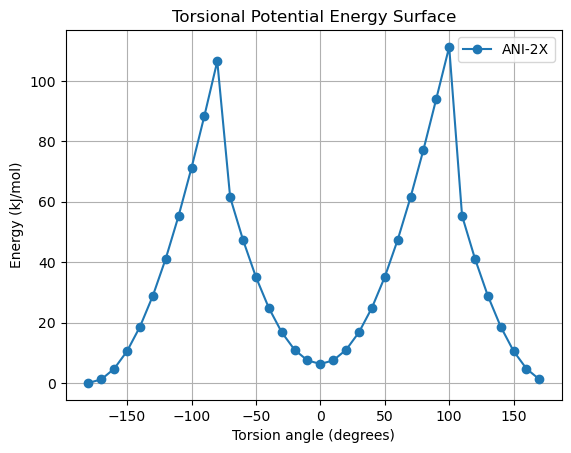

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Convert to numpy arrays
phi_arr = np.array(phi)
E_arr = np.array(E)
phi_deg = np.rad2deg(phi_arr)
E_rel = E_arr - E_arr.min()

plt.figure()
plt.plot(phi_deg, E_rel, marker='o',label='ANI-2X')
plt.xlabel("Torsion angle (degrees)")
plt.ylabel("Energy (kJ/mol)")
plt.title("Torsional Potential Energy Surface")
plt.legend()
plt.grid()

plt.show()

# How does it compare to DFT calculation?

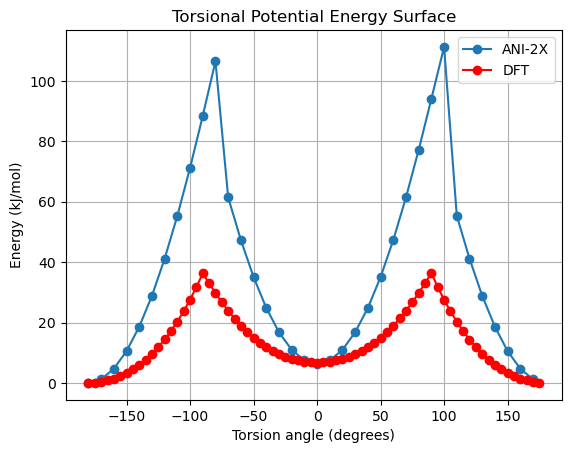

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Convert to numpy arrays
phi_arr = np.array(phi)
E_arr = np.array(E)
phi_deg = np.rad2deg(phi_arr)
E_rel = E_arr - E_arr.min()

data = np.loadtxt('session1_data/torsion_scan_dft.dat')

plt.figure()
plt.plot(phi_deg, E_rel, marker='o',label='ANI-2X')
plt.plot(np.rad2deg(data[:,0]), data[:,1]-data[:,1].min(), marker='o',color='r',label='DFT')
plt.xlabel("Torsion angle (degrees)")
plt.ylabel("Energy (kJ/mol)")
plt.title("Torsional Potential Energy Surface")
plt.legend()
plt.grid()

plt.show()

# Free energy with metadynamics: ML/MM Simulation Setup

This section introduces a hybrid Machine Learning / Molecular Mechanics (ML/MM) setup, where a neural network potential is combined with classical force fields to perform molecular simulations.

### Step-by-Step Explanation

1. **Import Core Libraries**  
   - `numpy`: For numerical operations and array manipulation.  
   - `openmmml.MLPotential`: Provides a machine learning potential interface compatible with OpenMM.  
   - `openff.toolkit.Molecule`: Used to create and manipulate molecules.  

2. **Import OpenMM Components**  
   - `ForceField`, `Modeller`, `Simulation`, `NoCutoff`, `PME`, `HBonds`: Essential OpenMM classes for building, parameterizing, and simulating molecular systems.  
   - `unit` and `Vec3`: Handle physical units (temperature, time, distance) and 3D vector positions.  
   - `VerletIntegrator`, `LangevinMiddleIntegrator`: Integrators for running molecular dynamics.  
   - `StateDataReporter`: Reports simulation data such as energies, temperature, and progress.

3. **Import Force Field Generators**  
   - `GAFFTemplateGenerator`: Automatically assigns GAFF parameters for small organic molecules, enabling ML/MM hybrid simulations.  

4. **Purpose of Imports**  
   - Together, these imports provide all the tools needed to define a molecular system, apply both classical and machine learning potentials, perform energy minimization, and run molecular dynamics simulations in an ML/MM framework.

In [17]:
import numpy as np
from openmmml import MLPotential
from openff.toolkit import Molecule
from openmm.app import ForceField, Modeller, Simulation, NoCutoff
from openmmforcefields.generators import GAFFTemplateGenerator
from openmm import unit, openmm
from openmm import VerletIntegrator
import sys
from openmm import LangevinMiddleIntegrator
from openmm.app import Simulation, StateDataReporter
from openmm.unit import kelvin, picosecond, femtosecond
from openmm.app import ForceField, Modeller, Simulation
from openmm.app import NoCutoff, PME, HBonds
from openmm import unit,Vec3

## Build Molecular System for ML/MM Simulation

This cell constructs and prepares a molecular system for hybrid ML/MM simulations, combining classical GAFF parameters with a machine learning potential.

### Step-by-Step Explanation

1. **Create the Molecule from SMILES**  
   - The molecule is defined using the SMILES string `"C=CC=O"`.  
   - This provides a simple, text-based way to specify the chemical structure.

2. **Generate 3D Conformers**  
   - One 3D conformer is generated to provide atomic coordinates for the simulation.  

3. **Set Up GAFF Parameters**  
   - A `GAFFTemplateGenerator` is initialized for the molecule using the GAFF 2.1 force field.  
   - These parameters provide classical bonded and nonbonded interactions for small organic molecules.

4. **Initialize the Force Field**  
   - A `ForceField` object is created with `"amber14/tip3p.xml"` to include the TIP3P water model.  
   - The GAFF template generator is registered to allow automatic assignment of GAFF parameters to the molecule.

5. **Create the Modeller Object**  
   - The molecule is converted to an OpenMM topology and its 3D positions.  
   - The `Modeller` combines the topology and positions into a single object, which can be further modified (e.g., adding solvent or ions) before the simulation.

### Outcome

After this cell, the molecule is fully parameterized with classical GAFF parameters and ready to incorporate a machine learning potential in an ML/MM hybrid simulation.

In [18]:
mol = Molecule.from_smiles("C=CC=O") 
mol.generate_conformers(n_conformers=1)
gaff = GAFFTemplateGenerator(molecules=mol, forcefield="gaff-2.1")
ff = ForceField("amber14/tip3p.xml")
ff.registerTemplateGenerator(gaff.generator)

# Build modeller (your molecule)
topology = mol.to_topology().to_openmm()
positions = mol.conformers[0].to_openmm()
modeller = Modeller(topology, positions)

## 3. Add Solvent and Set Up the ML/MM System

This cell prepares the molecular system for a hybrid ML/MM simulation by adding solvent and combining classical and machine learning potentials.

### Step-by-Step Explanation

1. **Add Solvent Box**  
   - A cubic solvent box is added around the molecule using `modeller.addSolvent`.  
   - **Parameters:**  
     - `model="tip3p"`: Uses the TIP3P water model.  
     - `boxSize=4.0 × 4.0 × 4.0 nm³`: Defines the dimensions of the solvent box.  
     - `ionicStrength=0.0 M`: No additional ions are added.  

2. **Create the Classical (MM) System**  
   - `ff.createSystem(topology)` generates the standard molecular mechanics system with GAFF and TIP3P water.  

3. **Select ML Region**  
   - The molecule’s atoms are identified to apply the machine learning potential.  
   - `ml_atoms` contains the indices of all atoms in the first chain (typically the solute).  

4. **Initialize the Machine Learning Potential**  
   - `MLPotential('ani2x')` loads the ANI-2x neural network potential.  

5. **Combine MM and ML Potentials**  
   - `potential.createMixedSystem` merges the classical MM system with the ML potential applied to the selected atoms, producing a hybrid ML/MM system.  

6. **Optional Full MM System Setup**  
   - A classical OpenMM system is also created with PME for long-range electrostatics, a 1 nm nonbonded cutoff, and bond constraints for hydrogens (`HBonds`).  
   - This ensures a properly solvated system with full periodic boundary conditions for comparison or hybrid simulations.

### Outcome

The system now has a solvated box, with the solute treated using the ANI-2x neural network potential and the solvent described with classical force fields, ready for hybrid ML/MM simulations.

In [19]:
# Add solvent box
modeller.addSolvent(
    ff,
    model="tip3p",
    boxSize=Vec3(4.0, 4.0, 4.0) * unit.nanometer,
    ionicStrength=0.0 * unit.molar
)

mm_system = ff.createSystem(topology)
chains = list(topology.chains())
ml_atoms = [atom.index for atom in chains[0].atoms()]
potential = MLPotential('ani2x')
system = potential.createMixedSystem(topology, mm_system, ml_atoms)

system = ff.createSystem(
    modeller.topology,
    nonbondedMethod=PME,
    nonbondedCutoff=1.0 * unit.nanometer,
    constraints=HBonds
)

/Users/miquel/miniconda3/envs/wednesday-afternoon/lib/python3.10/site-packages/torchani/resources/


## 4. Energy Minimization and Saving the Structure

This cell sets up and runs an energy minimization of the ML/MM system and saves the minimized structure to a PDB file.

### Step-by-Step Explanation

1. **Create a Langevin Integrator**  
   - `LangevinMiddleIntegrator` is used to propagate the system with stochastic dynamics, maintaining the temperature.  
   - **Parameters:**  
     - `300 K` — target temperature  
     - `1 / ps` — friction coefficient  
     - `1 fs` — integration timestep  

2. **Initialize the Simulation**  
   - A `Simulation` object is created with the system’s topology, the hybrid ML/MM system, and the integrator.  
   - The atomic positions from the `Modeller` object are loaded into the simulation context.

3. **Energy Minimization**  
   - `sim.minimizeEnergy()` relaxes the system to a local energy minimum, considering both classical (GAFF/TIP3P) and ML (ANI-2x) forces, as well as the torsional restraint.

4. **Save Minimized Structure**  
   - The minimized positions are extracted from the simulation context.  
   - A PDB file (`mini.pdb`) is written with the system topology and minimized coordinates for visualization or further simulations.

### Outcome

After this step, the ML/MM system is minimized and a PDB file of the relaxed structure is saved, providing a starting point for subsequent dynamics or analysis.

In [20]:
from openmm import LangevinMiddleIntegrator

integrator = LangevinMiddleIntegrator(
    300 * unit.kelvin,     #Desired temperature
    1.0 / unit.picosecond, #Damping factor
    1.0 * unit.femtosecond #MD integrator timestep
)

sim = Simulation(modeller.topology, system, integrator)
sim.context.setPositions(modeller.positions)

sim.minimizeEnergy()

from openmm.app import PDBFile
state = sim.context.getState(getPositions=True)
positions = state.getPositions()
PDBFile.writeFile(sim.topology, positions, open("mini.pdb", "w"))

## 5. Save reporters for the trajectory and perform NVT MD (first step of equilibration)

This is data seved every 1000 steps of the MD dynamics for analysis purpose.

Since the timestep is 1 fs, 50.000 steps correspond to 50 picoseconds of NVT simulation.

In [21]:
sim.context.setVelocitiesToTemperature(300 * unit.kelvin)

sim.reporters.append(
    StateDataReporter(
        sys.stdout, 1000,
        temperature=True,
        potentialEnergy=True,
        kineticEnergy=True,
        totalEnergy=True,
        density=True,
        step=True
    )
)

sim.reporters.append(
    StateDataReporter(
        "equinvt.dat", 1000,
        temperature=True,
        potentialEnergy=True,
        kineticEnergy=True,
        totalEnergy=True,
        step=True
    )
)


sim.step(50000)  # 50 ps

#"Step","Potential Energy (kJ/mole)","Kinetic Energy (kJ/mole)","Total Energy (kJ/mole)","Temperature (K)","Density (g/mL)"
1000,-89725.29640103685,12414.64962326968,-77310.64677776716,238.95961386267683,0.9736969328992358
2000,-86785.72120572435,14025.876420141663,-72759.84478558268,269.97282365186487,0.9736969328992358
3000,-84936.36573697435,14727.405698675197,-70208.96003829915,283.4759969671649,0.9736969328992358
4000,-83764.40089322435,15113.916600473225,-68650.48429275112,290.91563470565205,0.9736969328992358
5000,-83340.49854947435,15155.623906172113,-68184.87464330223,291.7184251159733,0.9736969328992358
6000,-83626.95753384935,15511.570848307922,-68115.38668554142,298.569761756916,0.9736969328992358
7000,-83132.10304166185,14895.546739041281,-68236.55630262056,286.71240873065426,0.9736969328992358
8000,-83301.26417447435,15117.64614954777,-68183.61802492657,290.98742179862523,0.9736969328992358
9000,-83135.87061978685,15410.271792871878,-67725.59882691497,296.61993764538573,0

## 6. Analyze NVT Equilibration Data

This cell loads simulation output data and visualizes the convergence of temperature and potential energy during an NVT (constant Number, Volume, Temperature) equilibration run.

### Step-by-Step Explanation

1. **Load Simulation Data**  
   - Data is read from `equinvt.dat` using `np.loadtxt`.  
   - Columns are extracted as follows:  
     - `steps` — simulation steps  
     - `potential_energy` — potential energy at each step  
     - `kinetic_energy` — kinetic energy  
     - `total_energy` — total energy  
     - `temperature` — instantaneous temperature  

2. **Compute Moving Averages**  
   - A simple moving average function smooths the data over a specified window (`window = 50` steps).  
   - `pot_smooth` — smoothed potential energy  
   - `temp_smooth` — smoothed temperature  

3. **Create Subplots**  
   - Two vertically stacked subplots (`2x1`) share the x-axis (simulation steps).  

4. **Plot Temperature Convergence**  
   - Raw temperature values are plotted with low opacity.  
   - Smoothed temperature is plotted in red for clarity.  
   - A horizontal dashed line shows the average temperature.  
   - Labels, title, legend, and grid improve readability.

5. **Plot Potential Energy Convergence**  
   - Raw potential energy values are plotted with low opacity.  
   - Smoothed potential energy is overlaid in red.  
   - A horizontal dashed line indicates the average potential energy.  
   - Labels, title, legend, and grid improve visualization.

6. **Outcome**  
   - These plots allow visual assessment of NVT equilibration, showing whether the system’s temperature and potential energy have stabilized, which is crucial before production runs.

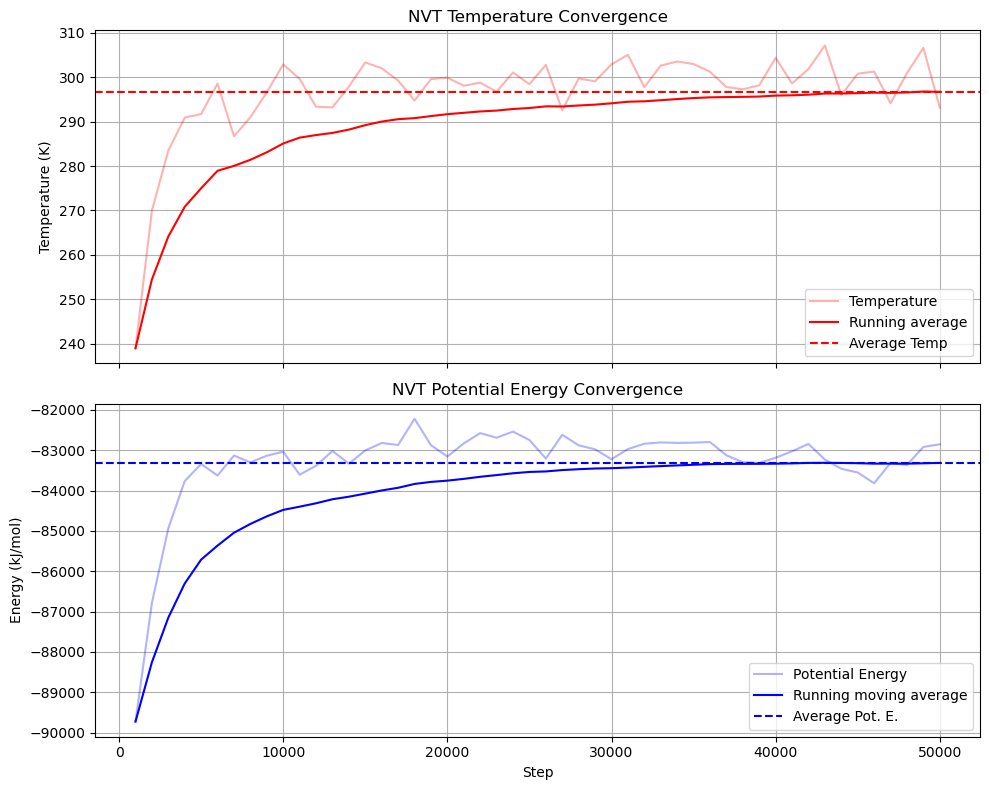

In [22]:
# Load the data
data = np.loadtxt('equinvt.dat',delimiter=',')

# Extract columns
steps = data[:, 0]
potential_energy = data[:, 1]
kinetic_energy = data[:, 2]
total_energy = data[:, 3]
temperature = data[:, 4]

def moving_average(x):
    return np.cumsum(x) / np.arange(1, len(x) + 1)

pot_smooth = moving_average(potential_energy)
temp_smooth = moving_average(temperature)

# Create subplots
fig, axs = plt.subplots(2, 1, figsize=(10,8), sharex=True)

# ---- Subplot 1: Temperature ----
axs[0].plot(steps, temperature, alpha=0.3, color='r', label='Temperature')
axs[0].plot(steps, temp_smooth, color='r', label='Running average')
axs[0].axhline(y=np.mean(temperature), color='r', linestyle='--', label='Average Temp')
axs[0].set_ylabel('Temperature (K)')
axs[0].set_title('NVT Temperature Convergence')
axs[0].legend()
axs[0].grid(True)

# ---- Subplot 2: Energies ----
axs[1].plot(steps, potential_energy, color='b',alpha=0.3, label='Potential Energy')
axs[1].plot(steps, pot_smooth, color='b', label='Running moving average')
axs[1].axhline(y=np.mean(potential_energy), color='b', linestyle='--', label='Average Pot. E.')
axs[1].set_xlabel('Step')
axs[1].set_ylabel('Energy (kJ/mol)')
axs[1].set_title('NVT Potential Energy Convergence')
axs[1].legend()
axs[1].grid(True)

plt.tight_layout()
plt.show()

## 7. NPT Equilibration with Monte Carlo Barostat

This cell sets up and runs an NPT (constant Number, Pressure, Temperature) equilibration to allow the system to reach the target pressure and temperature.

### Step-by-Step Explanation

1. **Create a Monte Carlo Barostat**  
   - `MonteCarloBarostat` regulates pressure in the simulation.  
   - **Parameters:**  
     - `1 atm` — target pressure  
     - `300 K` — temperature for the barostat  
     - `25` — frequency (in integration steps) at which volume adjustments are attempted  

2. **Add the Barostat to the System**  
   - `system.addForce(barostat)` incorporates the barostat into the hybrid ML/MM system.  

3. **Reinitialize the Simulation Context**  
   - `sim.context.reinitialize(True)` ensures that the simulation context recognizes the newly added barostat and resets internal variables.

4. **Add a State Data Reporter**  
   - `StateDataReporter` writes simulation data to `equinpt.dat` every 1000 steps.  
   - The following properties are recorded:  
     - `temperature`  
     - `potentialEnergy`  
     - `kineticEnergy`  
     - `totalEnergy`  
     - `density`  
     - `step` (simulation step count)  

5. **Run the NPT Simulation**  
   - `sim.step(100000)` advances the simulation by 100,000 steps.  
   - Depending on the timestep, this typically corresponds to 100 ps to 1 ns.  
   - This equilibration allows the system volume, density, and energies to stabilize under constant pressure and temperature.

### Outcome

After this step, the system is equilibrated under NPT conditions, providing a reliable starting point for production molecular dynamics simulations with both classical and machine learning potentials.

In [23]:
from openmm import MonteCarloBarostat

barostat = MonteCarloBarostat(
    1 * unit.atmosphere,
    300 * unit.kelvin,
    25
)
system.addForce(barostat)
sim.context.reinitialize(True)

sim.reporters.append(
    StateDataReporter(
        "equinpt.dat", 1000,
        temperature=True,
        potentialEnergy=True,
        kineticEnergy=True,
        totalEnergy=True,
        density=True,
        step=True
    )
)


sim.step(100000)  # 100 ps - 1 ns typical

51000,-83193.36001441744,15377.489091305877,-67815.87092311156,295.98892976797424,0.9786818033895949
52000,-83609.19984568772,15520.69186045276,-68088.50798523496,298.7453247898092,0.9927189640950437
53000,-83692.44111223065,15254.028458440444,-68438.4126537902,293.6125352621263,0.9812964302407695
54000,-83536.97796492185,15615.878074962879,-67921.09988995898,300.5774877387944,0.9843213521442692
55000,-83185.98155699635,15532.04000381846,-67653.9415531779,298.9637560817921,0.9813029206702122
56000,-82781.62399629003,15190.59222398547,-67591.03177230456,292.391502164112,0.9787041528330422
57000,-83429.31812685379,15733.531877492089,-67695.7862493617,302.8421112340204,0.9834838652993065
58000,-83295.11130796635,15333.328942936612,-67961.78236502974,295.1389265602592,0.9893288024620254
59000,-83456.58607626939,15738.367050923873,-67718.21902534552,302.9351796017376,0.9826411504676669
60000,-83028.80945682834,15576.647727902397,-67452.16172892594,299.8223743147554,0.9744529882904859
61000,

## 8. Analyze NPT Equilibration Data

This cell loads the NPT equilibration output and visualizes the convergence of temperature, potential energy, and density during the simulation.

### Step-by-Step Explanation

1. **Load Simulation Data**  
   - Data is read from `equinpt.dat` using `np.loadtxt`.  
   - Columns are extracted as follows:  
     - `steps` — simulation steps  
     - `potential_energy` — potential energy  
     - `kinetic_energy` — kinetic energy  
     - `total_energy` — total energy  
     - `temperature` — instantaneous temperature  
     - `density` — system density  

2. **Compute Moving Averages**  
   - A simple moving average smooths fluctuations over a specified window (`window = 50` steps).  
   - `temp_smooth`, `pot_smooth`, `dens_smooth` provide smoothed curves for temperature, potential energy, and density, respectively.  

3. **Create Subplots**  
   - Three vertically stacked subplots (`3x1`) share the x-axis (simulation steps).  

4. **Plot Temperature Convergence**  
   - Raw temperature values are plotted with low opacity.  
   - Smoothed temperature and average temperature are overlaid for clarity.  
   - Title, axis labels, legend, and grid are added.

5. **Plot Potential Energy Convergence**  
   - Raw potential energy values are plotted with low opacity.  
   - Smoothed energy and average potential energy are overlaid.  
   - Proper labels, legend, title, and grid are added for clarity.

6. **Plot Density Convergence**  
   - Raw density values are plotted with low opacity.  
   - Smoothed density and average density are overlaid.  
   - This subplot visualizes how the system volume stabilizes under NPT conditions.

7. **Outcome**  
   - These plots allow assessment of equilibration under constant pressure and temperature.  
   - Stable temperature, potential energy, and density indicate the system is ready for production runs in ML/MM simulations.

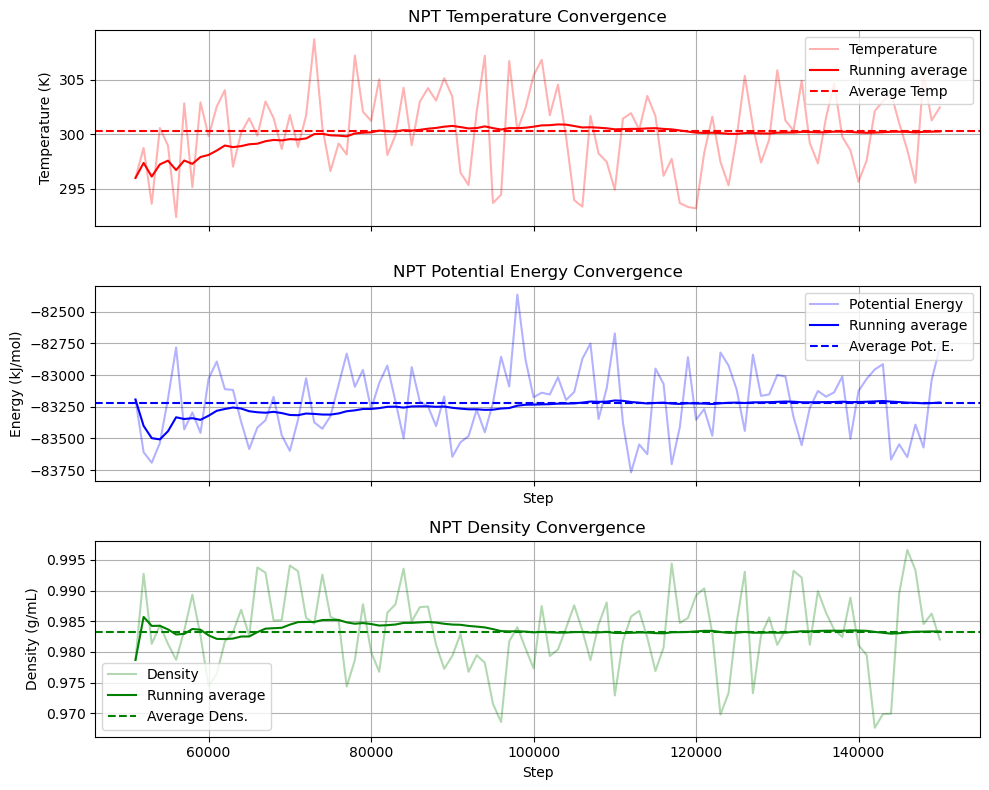

In [24]:
# Load the data
data = np.loadtxt('equinpt.dat',delimiter=',')

# Extract columns
steps = data[:, 0]
potential_energy = data[:, 1]
kinetic_energy = data[:, 2]
total_energy = data[:, 3]
temperature = data[:, 4]
density = data[:, 5]

# Define a moving average function
def moving_average(x):
    return np.cumsum(x) / np.arange(1, len(x) + 1)

dens_smooth = moving_average(density)
pot_smooth = moving_average(potential_energy)
temp_smooth = moving_average(temperature)

# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(10,8), sharex=True)

# ---- Subplot 1: Temperature ----
axs[0].plot(steps, temperature, alpha=0.3, color='r', label='Temperature')
axs[0].plot(steps, temp_smooth, color='r', label='Running average')
axs[0].axhline(y=np.mean(temperature), color='r', linestyle='--', label='Average Temp')
axs[0].set_ylabel('Temperature (K)')
axs[0].set_title('NPT Temperature Convergence')
axs[0].legend()
axs[0].grid(True)

# ---- Subplot 2: Energies ----
axs[1].plot(steps, potential_energy, color='b',alpha=0.3, label='Potential Energy')
axs[1].plot(steps, pot_smooth, color='b', label='Running average')
axs[1].axhline(y=np.mean(potential_energy), color='b', linestyle='--', label='Average Pot. E.')
axs[1].set_xlabel('Step')
axs[1].set_ylabel('Energy (kJ/mol)')
axs[1].set_title('NPT Potential Energy Convergence')
axs[1].legend()
axs[1].grid(True)

# ---- Subplot 3: Density ----
axs[2].plot(steps, density, color='g',alpha=0.3, label='Density')
axs[2].plot(steps, dens_smooth, color='g', label='Running average')
axs[2].axhline(y=np.mean(density), color='g', linestyle='--', label='Average Dens.')
axs[2].set_xlabel('Step')
axs[2].set_ylabel('Density (g/mL)')
axs[2].set_title('NPT Density Convergence')
axs[2].legend()
axs[2].grid(True)

plt.tight_layout()
plt.show()

## Summary of Metadynamics Theory

**Source**: https://www.plumed.org/doc-v2.9/user-doc/html/belfast-6.html

In **metadynamics**, an external history-dependent bias potential is constructed in the space of a few selected degrees of freedom ($\vec{s}(\mathbf{q})$), generally called **collective variables (CVs)**. This bias potential is built as a sum of Gaussian kernels deposited along the trajectory in the CV space:

$$
V(\vec{s}, t) = \sum_{k\tau < t} W(k\tau) \exp \left( - \sum_{i=1}^{d} \frac{(s_i - s_i(\mathbf{q}(k\tau)))^2}{2\sigma_i^2} \right)
$$

Where:  

- $\tau$ is the Gaussian deposition stride  
- $\sigma_i$ is the width of the Gaussian for the $i$-th CV  
- $W(k\tau)$ is the height of the Gaussian  

The effect of the metadynamics bias potential is to **push the system away from any local minimum**, encouraging exploration of new regions of phase space. In the long-time limit, the bias potential converges to the negative of the free energy as a function of the CVs:

$$
V(\vec{s}, t \to \infty) = -F(\vec{s}) + C
$$

---

### Standard vs. Well-Tempered Metadynamics

- In **standard metadynamics**, Gaussian kernels of **constant height** are added throughout the simulation.  
  - The system is pushed into high free-energy regions  
  - The free energy estimate oscillates around the true value  


- In **well-tempered metadynamics**, the Gaussian height **decreases over time** according to:

$$
W(k\tau) = W_0 \exp \left( - \frac{V(\vec{s}(\mathbf{q}(k\tau)), k\tau)}{k_B \Delta T} \right)
$$

Where:  

- $W_0$ = initial Gaussian height  
- $\Delta T$ = input parameter with dimensions of temperature  
- $k_B$ = Boltzmann constant  

With this rescaling, the bias potential smoothly converges, but does **not fully compensate the underlying free energy**:

$$
V(\vec{s}, t \to \infty) = -\frac{\Delta T}{T + \Delta T} F(\vec{s}) + C
$$

Where $T$ is the system temperature.  

- In the long-time limit, the CVs sample an ensemble at an **effective temperature** $T + \Delta T$, higher than the system temperature $T$.  
- Choosing $\Delta T$ regulates the extent of free-energy exploration:  
  - $\Delta T = 0$ → standard molecular dynamics  
  - $\Delta T \to \infty$ → standard metadynamics  

---

### Bias Factor

In PLUMED and metadynamics literature, the **bias factor**  $\gamma$ is defined as the ratio of the effective CV temperature to the system temperature:

$$\gamma = \frac{T + \Delta T}{T}$$

The bias factor should be carefully chosen to ensure that **relevant free-energy barriers are crossed efficiently** within the simulation timescale.

---

**References:**  
For more details, see review papers on metadynamics [79, 12, 128].

## 9. Prepare PLUMED Input File for Metadynamics

This cell generates a PLUMED input file (`plumed.dat`) to perform metadynamics simulations on a specific torsion in the molecule.

![alt text](metad-scheme.png "Metadynamics")

### Step-by-Step Explanation

1. **Define the Torsion Collective Variable**  
   - `d: TORSION ATOMS=1,2,3,4`  
     - Defines a torsion angle as the collective variable (CV) for metadynamics.  
     - The four atoms `(1,2,3,4)` specify the dihedral to monitor.  

2. **Set Up Metadynamics Parameters**  
   - `METAD ...` block configures the metadynamics simulation:  
     - `ARG=d` — the CV to bias (the torsion).  
     - `PACE=500` — frequency of bias deposition (every 500 steps).  
     - `HEIGHT=1.2` — initial Gaussian height in energy units.  
     - `TEMP=300` — simulation temperature.  
     - `SIGMA=0.2` — width of the Gaussian in CV units.  
     - `BIASFACTOR=10` — bias factor for well-tempered metadynamics.  
     - `FILE=HILLS` — file to store the deposited Gaussian hills.  

3. **Output CV Values**  
   - `PRINT STRIDE=100 ARG=d FILE=COLVAR`  
     - Saves the value of the torsion every 100 steps to `COLVAR`.  

4. **Write to File**  
   - The multi-line string is saved to `plumed.dat` using standard Python file I/O.  
   - The print statement confirms successful creation of the input file.

### Outcome

After this cell, `plumed.dat` is ready to be used with OpenMM or other MD engines that interface with PLUMED, enabling metadynamics simulations to explore the torsion angle landscape of the molecule.

In [20]:
# Define the content as a multi-line string
plumed_content = """d: TORSION ATOMS=1,2,3,4

METAD ...
  ARG=d
  PACE=500
  HEIGHT=1.2
  TEMP=300
  SIGMA=0.2
  BIASFACTOR=10
  FILE=HILLS
... METAD

PRINT STRIDE=100 ARG=d FILE=COLVAR
"""

# Open a file called plumed.dat in write mode and save the content
with open("plumed.dat", "w") as file:
    file.write(plumed_content)

print("plumed.dat has been created successfully.")

plumed.dat has been created successfully.


## 10. Integrate PLUMED with OpenMM and Set Up NPT Simulation

This cell loads the PLUMED input file, adds it to the system, and sets up an NPT simulation with a Langevin integrator and Monte Carlo barostat.

### Step-by-Step Explanation

1. **Load the PLUMED Script**  
   - The PLUMED input file `plumed.dat` is read into the variable `plumed_script`.  
   - This contains the torsion collective variable and metadynamics parameters defined previously.  

2. **Add PLUMED Force to the System**  
   - `PlumedForce(plumed_script)` creates a force object that applies the metadynamics bias.  
   - `system.addForce(plumed)` incorporates this bias into the ML/MM simulation.  

3. **Add Monte Carlo Barostat**  
   - `MonteCarloBarostat` regulates pressure at `1 atm` and temperature at `300 K`.  
   - Volume adjustments occur every 25 steps.  
   - This ensures the simulation runs under NPT conditions.  

4. **Set Up Langevin Integrator**  
   - `LangevinMiddleIntegrator` maintains temperature while integrating dynamics.  
   - **Parameters:**  
     - `300 K` — target temperature  
     - `1/ps` — friction coefficient  
     - `2 fs` — timestep for integration  

### Outcome

The system is now ready to run an NPT molecular dynamics simulation under the influence of a metadynamics bias on the torsion angle. This setup combines ML/MM potentials, temperature and pressure control, and enhanced sampling through PLUMED.

In [21]:
from openmmplumed import PlumedForce

with open("plumed.dat", "r") as f:
    plumed_script = f.read()

plumed = PlumedForce(plumed_script)
system.addForce(plumed)

barostat = MonteCarloBarostat(
    1 * unit.atmosphere,
    300 * unit.kelvin,
    25
)
system.addForce(barostat)

from openmm import LangevinMiddleIntegrator

integrator = LangevinMiddleIntegrator(
    300 * unit.kelvin,
    1.0/unit.picosecond,
    2.0*unit.femtosecond
)

## 11. Run Metadynamics MD Simulation

This cell runs a molecular dynamics simulation under NPT conditions with the previously defined PLUMED metadynamics bias.

### Step-by-Step Explanation

1. **Initialize the Simulation**  
   - `Simulation(modeller.topology, system, integrator)` creates a new OpenMM simulation object using the ML/MM system with PLUMED.  
   - Positions from the `Modeller` are loaded with `setPositions`.  
   - Velocities are initialized to correspond to `300 K` using `setVelocitiesToTemperature`.  

2. **Add Simulation Reporters**  
   - Two `StateDataReporter` objects are added:  
     1. **Standard Output Reporter**  
        - Prints temperature, potential energy, density, and step to the console every 1000 steps.  
     2. **File Reporter**  
        - Writes the same properties to `metad.out` every 1000 steps for later analysis.  

3. **Run the Simulation**  
   - `sim.step(5000000)` advances the simulation by 5 million steps.  
   - Depending on the timestep (`2 fs`), this corresponds to approximately 10 ns of simulation time, which is typically a minimum for observing meaningful metadynamics sampling.

### Outcome

The system is now evolving under NPT conditions with enhanced sampling on the torsion angle.  
The PLUMED bias will encourage exploration of different torsional conformations while temperature, density, and energies are recorded for analysis.

In [22]:
sim = Simulation(modeller.topology, system, integrator)
sim.context.setPositions(modeller.positions)
sim.context.setVelocitiesToTemperature(300*unit.kelvin)

sim.reporters.append(
    StateDataReporter(
        sys.stdout, 1000,
        temperature=True,
        potentialEnergy=True,
        density=True,
        step=True
    )
)

sim.reporters.append(
    StateDataReporter(
        "metad.out", 1000,
        temperature=True,
        potentialEnergy=True,
        density=True,
        step=True
    )
)

sim.step(2000000)  # 4 ns run

#"Step","Potential Energy (kJ/mole)","Temperature (K)","Density (g/mL)"
1000,-75175.58548447315,367.5133768048443,0.9063095916884473
2000,-81047.36315288453,317.62787279261113,0.9624767924657776
3000,-82828.97953250934,303.4697066824995,0.982091161348236
4000,-82589.24594665889,303.07888944678723,0.9834019232346201
5000,-82450.01695936959,308.62406679275966,0.975694646652494
6000,-82863.32820168993,305.68109576156303,0.9900303372613491
7000,-82776.22624353232,297.0049319129054,0.9832736845266391
8000,-83286.53782411682,298.08105966274724,0.9836601486163957
9000,-83496.67198776157,305.59340087705783,0.9960827405493887
PLUMED: PLUMED is starting
PLUMED: Version: 2.9.2 (git: Unknown) compiled on Sep  4 2024 at 12:28:06
PLUMED: Please cite these papers when using PLUMED [1][2]
PLUMED: For further information see the PLUMED web page at http://www.plumed.org
PLUMED: Root: /Users/miquel/miniconda3/envs/wednesday-afternoon/lib/plumed
PLUMED: For installed feature, see /Users/miquel/miniconda3/

## 12. Post-Processing Metadynamics: Reconstruct Free Energy Surface

This cell uses PLUMED's `sum_hills` utility to reconstruct the free energy surface (FES) from the metadynamics simulation.

### Step-by-Step Explanation

1. **Run PLUMED `sum_hills`**  
   - `subprocess.run` executes the external command line tool `plumed sum_hills`.  
   - **Parameters:**  
     - `--hills HILLS` — input file containing the deposited Gaussian biases from the metadynamics simulation.  
     - `--outfile fes.dat` — output file where the reconstructed free energy surface is saved.  
     - `--mintozero` — shifts the minimum of the free energy surface to zero for easier interpretation.  

2. **Capture Output**  
   - `capture_output=True` and `text=True` capture both standard output and error messages.  
   - `check=True` ensures that any errors in running the command will raise a Python exception.  

3. **Print Results**  
   - `result.stdout` shows normal command output, if any.  
   - `result.stderr` shows error or warning messages from PLUMED.

### Outcome

After this step, `fes.dat` contains the reconstructed torsional free energy profile, allowing analysis of the energy landscape explored during the metadynamics simulation.

In [23]:
import subprocess

result = subprocess.run(
    [
        "plumed", "sum_hills",
        "--hills", "HILLS",
        "--outfile", "fes.dat",
        "--mintozero"
    ],
    capture_output=True,
    text=True,
    check=True
)

print(result.stdout)
print(result.stderr)


PLUMED: PLUMED is starting
PLUMED: Version: 2.9.2 (git: Unknown) compiled on Sep  4 2024 at 12:28:06
PLUMED: Please cite these papers when using PLUMED [1][2]
PLUMED: For further information see the PLUMED web page at http://www.plumed.org
PLUMED: Root: /Users/miquel/miniconda3/envs/wednesday-afternoon/lib/plumed
PLUMED: For installed feature, see /Users/miquel/miniconda3/envs/wednesday-afternoon/lib/plumed/src/config/config.txt
PLUMED: Molecular dynamics engine: 
PLUMED: Precision of reals: 8
PLUMED: Running over 1 node
PLUMED: Number of threads: 1
PLUMED: Cache line size: 512
PLUMED: Number of atoms: 1
PLUMED: File suffix: 
PLUMED: Timestep: 0.000000
PLUMED: KbT has not been set by the MD engine
PLUMED: It should be set by hand where needed
PLUMED: Relevant bibliography:
PLUMED:   [1] The PLUMED consortium, Nat. Methods 16, 670 (2019)
PLUMED:   [2] Tribello, Bonomi, Branduardi, Camilloni, and Bussi, Comput. Phys. Commun. 185, 604 (2014)
PLUMED: Please read and cite where appropriate!

## 13. Visualize Metadynamics Output: Torsion Evolution

This cell loads the metadynamics collective variable data and plots the evolution of the torsion angle over time.

### Step-by-Step Explanation

1. **Load Data from `COLVAR`**  
   - `np.loadtxt("COLVAR")` reads the output from PLUMED that contains the torsion angle (`phi`) and the corresponding bias (`F`) over the simulation.  
   - Columns extracted:  
     - `phi` — torsion angle (in radians)  
     - `F` — metadynamics bias or free energy estimate  

2. **Plot Torsion Evolution**  
   - `plt.plot(phi, F)` creates a 2D plot showing how the torsion angle evolves over simulation time.  
   - X-axis: simulation steps or time (ps)  
   - Y-axis: dihedral angle (radians)  

3. **Add Labels and Display Plot**  
   - `ylabel` and `xlabel` clearly label the axes.  
   - `plt.show()` renders the figure in the notebook.

### Outcome

This plot provides a visual overview of how the torsion angle changes during the metadynamics simulation and gives insight into which conformations are sampled over time.

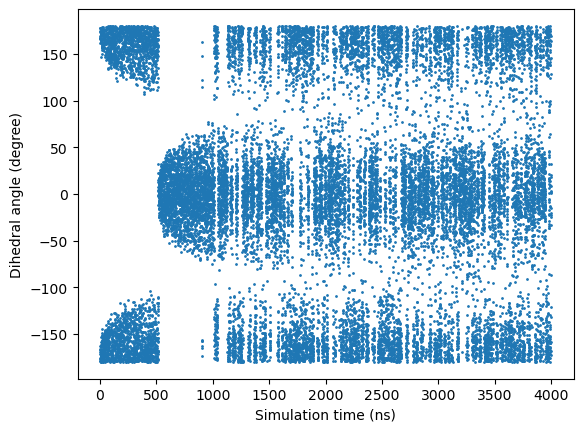

In [24]:
import numpy as np
import matplotlib.pyplot as plt
data = np.loadtxt("COLVAR")
plt.scatter(data[:,0], np.rad2deg(data[:,1]),s=1)
plt.ylabel("Dihedral angle (degree)")
plt.xlabel("Simulation time (ns)")
plt.show()

In [25]:
# --- METADYNAMICS BIAS RECONSTRUCTION FROM HILLS ---

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# =========================
# USER PARAMETERS
# =========================
hills_file = "HILLS"

sigma = 0.1
use_well_tempered = False

# Only needed if well-tempered:
kB = 0.008314
deltaT = 1000.0

# >>> IMPORTANT: define BEFORE building snapshots
grid_points = 150
frame_stride = 10

# =========================
# READ HILLS FILE
# =========================
def read_hills(filename):
    data = []
    with open(filename) as f:
        for line in f:
            if line.startswith("#") or len(line.strip()) == 0:
                continue
            data.append([float(x) for x in line.split()])
    return np.array(data)

hills = read_hills(hills_file)

time = hills[:, 0]
s_hills = hills[:, 1]
heights = hills[:, 3] if hills.shape[1] > 3 else np.ones_like(s_hills)

# =========================
# GRID DEFINITION
# =========================
s_min, s_max = np.min(s_hills), np.max(s_hills)
grid = np.linspace(s_min - 1.0, s_max + 1.0, grid_points)

# =========================
# BUILD BIAS OVER TIME
# =========================
V = np.zeros_like(grid)
snapshots = []
last_gaussians = []
frame_indices = []

for i in range(len(s_hills)):
    s_i = s_hills[i]

    if use_well_tempered:
        V_si = np.interp(s_i, grid, V)
        w_t = heights[i] * np.exp(-V_si / (kB * deltaT))
    else:
        w_t = heights[i]

    gaussian = w_t * np.exp(-(grid - s_i)**2 / (2 * sigma**2))

    V += gaussian

    if i % frame_stride == 0:
        snapshots.append(V.copy())
        last_gaussians.append(gaussian)
        frame_indices.append(i)

snapshots = np.array(snapshots)
last_gaussians = np.array(last_gaussians)

# =========================
# KEEP ONLY FIRST 1/3
# =========================
n_keep = len(snapshots) // 3

snapshots = snapshots[:n_keep]
last_gaussians = last_gaussians[:n_keep]
frame_indices = frame_indices[:n_keep]

# =========================
# FINAL PROFILE
# =========================
V_final = snapshots[-1]

# =========================
# ANIMATION SETUP
# =========================
fig, ax = plt.subplots(figsize=(7,5))

line_pot, = ax.plot(phi_arr, E_rel, label='ANI-2X')
line_bias, = ax.plot(grid, snapshots[0], label="Accumulated bias")
line_last, = ax.plot(grid, last_gaussians[0], '--', label="Current Gaussian")
line_final, = ax.plot(grid, V_final, ':', label="Final bias")

point, = ax.plot([], [], 'ro', label="Hill position")

ax.set_xlabel("Collective Variable")
ax.set_ylabel("Bias Potential")
ax.legend()

ax.set_xlim(grid.min(), grid.max())
ax.set_ylim(0, np.max(E_rel)*1.2)

# =========================
# UPDATE FUNCTION
# =========================
def update(frame):
    line_bias.set_ydata(snapshots[frame])
    line_last.set_ydata(last_gaussians[frame])

    idx = frame_indices[frame]
    s_i = s_hills[idx]
    V_i = np.interp(s_i, grid, snapshots[frame])

    point.set_data([s_i], [V_i])

    ax.set_title(f"Hill {idx}")

    return line_bias, line_last, point

# =========================
# RUN ANIMATION
# =========================
ani = FuncAnimation(
    fig,
    update,
    frames=len(snapshots),
    interval=120,
    blit=False
)

# =========================
# DISPLAY (size-safe)
# =========================
from IPython.display import HTML
import matplotlib as mpl

mpl.rcParams['animation.embed_limit'] = 40
plt.close(fig) 
HTML(ani.to_jshtml())

## 14. Visualize Metadynamics Hills

This cell loads the Gaussian hills deposited during metadynamics and visualizes their height as a function of simulation progress.

### Step-by-Step Explanation

1. **Load Data from `HILLS`**  
   - `np.loadtxt("HILLS")` reads the file generated by PLUMED that contains all deposited Gaussian hills.  
   - Columns extracted:  
     - `phi` — value of the collective variable (torsion angle) at which the Gaussian was deposited  
     - `F` — height of the Gaussian (bias energy added)  

2. **Plot Gaussian Heights**  
   - `plt.scatter(phi, F)` plots each Gaussian hill as a point, showing where and how much bias was added to the torsion angle.  
   - X-axis: torsion angle (radians or simulation step, depending on PLUMED configuration)  
   - Y-axis: Gaussian height (energy added in kJ/mol or arbitrary units)  

3. **Add Labels and Display Plot**  
   - Axis labels provide context for the plot.  
   - `plt.show()` renders the scatter plot in the notebook.

### Outcome

This visualization allows inspection of the bias deposition during metadynamics, showing which torsion angles were sampled and how the free energy landscape was gradually built.

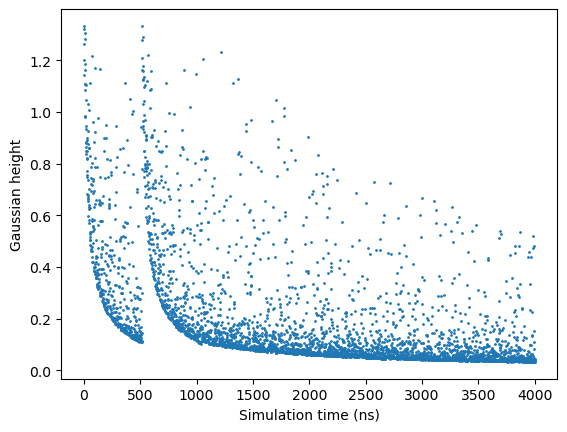

In [26]:
data = np.loadtxt("HILLS")

phi = data[:,0]
F = data[:,3] 

plt.scatter(phi, F,s=1)
plt.ylabel("Gaussian height")
plt.xlabel("Simulation time (ns)")
plt.show()

## 15. Plot the Reconstructed Free Energy Surface

This cell loads the free energy surface (FES) reconstructed from metadynamics and plots it as a function of the torsion angle.

### Step-by-Step Explanation

1. **Load Data from `fes.dat`**  
   - `np.loadtxt("fes.dat")` reads the reconstructed FES generated by PLUMED’s `sum_hills` tool.  
   - Columns extracted:  
     - `phi` — torsion angle (radians)  
     - `F` — free energy corresponding to that angle  

2. **Shift Free Energy Minimum to Zero**  
   - `F = data[:,1] - np.min(data[:,1])` ensures the lowest point of the free energy surface is set to zero for easier interpretation.

3. **Plot Free Energy Surface**  
   - `plt.plot(phi, F)` creates a 2D line plot of free energy versus torsion angle.  
   - X-axis: dihedral angle (radians)  
   - Y-axis: free energy (kJ/mol)  

4. **Add Labels and Display Plot**  
   - `xlabel` and `ylabel` clearly label the axes.  
   - `plt.show()` renders the plot in the notebook.

### Outcome

The resulting plot shows the torsional free energy profile of the molecule, highlighting energy barriers and preferred conformations sampled during the metadynamics simulation.

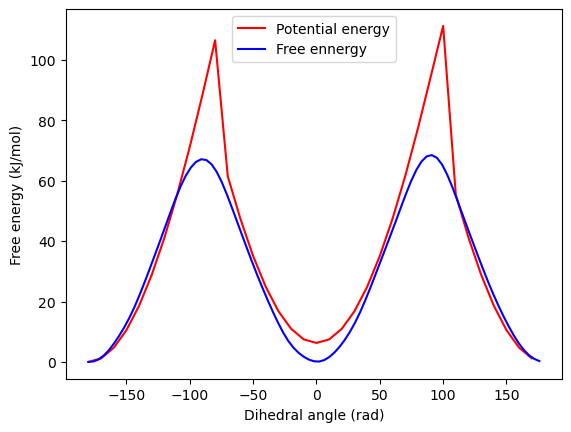

In [33]:
data = np.loadtxt("fes.dat")

phi = np.rad2deg(data[:,0])
F = data[:,1] - np.min(data[:,1])

plt.plot(phi_deg, E_rel, color='r',label='Potential energy')
plt.plot(phi, F, color='b', label="Free ennergy")
plt.xlabel("Dihedral angle (rad)")
plt.ylabel("Free energy (kJ/mol)")
plt.legend()
plt.show()